
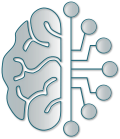

**Start at:** Friday 28 June 2024, 14:57:44  
**Hostname:** insa-12842 (Linux)

<p style="text-align: center"><img width="800px" src="./config/svg/pyPhysChemBanner.svg" style="margin-left:auto; margin-right:auto"/></p>

In [1]:
import os
import sys

cwd0 = './config/'
sys.path.append(cwd0)

import visualID_Eng as vID
from visualID_Eng import color, fg, bg, hl
vID.init(cwd0)
import tools4pyPhysChem as t4pPC

#cancel the "last show-up" behaviour of Jupyter notebooks
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# 2D Convolutional Neural Networks (CNN)

<div class="intro">
    
**Authors: I. C. Gerber and R. Poteau**
</div>

## Introduction

<div class="intro">

The convolutional layer computes the convolutional operation of the input images using filters to extract features and scans the entire image looking through this filter

**Filters** are also sometimes called **windows**, or **kernels**. 
</div>

<div class="rq">

`imread` of matplotlib returns the image data as a `numpy.array`, which shape is

- (M, N) for grayscale images.

- (M, N, 3) for RGB images.

- (M, N, 4) for RGBA images.

PNG images are returned as float arrays (0-1). All other formats are returned as int arrays
</div>

### Useful functions

In [2]:
def plotimgs_SideBySide(img, imgW=8, titles=None, histogram=True):
    from matplotlib import pyplot as plt
    from skimage import exposure
    import numpy as np

    nPixH, nPixW = img[0].shape
    print(f"W: {nPixW} pixels x H: {nPixH} pixels = {nPixW*nPixH} pixels")

    def plotHisto(img, nplotsAxis0, nplotsAxis1, index):
        plt.subplot(nplotsAxis0, nplotsAxis1, index)
        plt.hist(img.ravel(), bins=256, histtype='step', color='black', label="histogram")
        plt.xlabel('Pixel intensity (0:Black ⇾ 1:White)')
        plt.xlim(0,1)
        plt.ylabel('Number of pixels')
        plt.legend()
        # Display cumulative distribution
        ax = plt.gca()
        ax_twinx = ax.twinx() 
        img_cdf, bins = exposure.cumulative_distribution(img, 256)
        ax_twinx.plot(bins, img_cdf, 'r', label="cumulative distribution")
        plt.legend()

    nimg=len(img)

    nplotsAxis1 = nimg
    if histogram:
        nplotsAxis0 = 2
    else:
        nplotsAxis0 = 1

    Wplot = nimg*imgW
    imgH = (nPixH/nPixW)*imgW
    heightHisto = 80*imgH/100
    # print(imgW,imgH)
    plt.figure(figsize=(Wplot, (imgH + heightHisto))) #
    colorTitle = 'black'
    for i in range(nimg):
        plt.subplot(nplotsAxis0, nplotsAxis1, i+1) # the third argument represents the index of the subplot that will be used
        plt.imshow(img[i], cmap="gray", interpolation="nearest") 
        plt.axis('off')
        plt.title(titles[i],color=colorTitle)
    
        if histogram:
            plotHisto(img[i], nplotsAxis0, nplotsAxis1, (nimg+i+1))
    plt.subplots_adjust(wspace=0.2, hspace=0.05)
    plt.show()

def kernel2D(N):
    import numpy as np
    K = np.ones((N,N),dtype=np.float64)/(N**2)
    return K


### Calculate the "derivatives" of an image

#### First derivative = convolution in 1D

$Ky=[-1,0,1]$

array([229, 230, 214], dtype=uint8)

0.8966035294117647

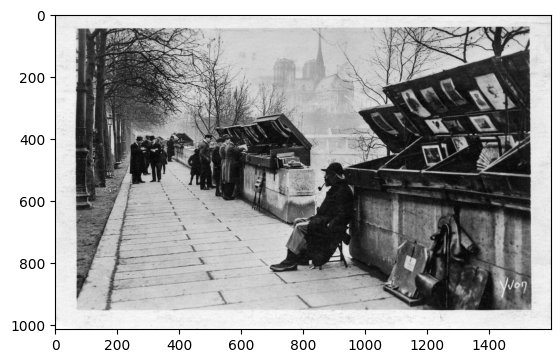

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import rgb2gray
from scipy.ndimage import convolve, convolve1d

img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')
display(img[0,0]) #let's have a look at the first pixel
imgGray = rgb2gray(img)
display(imgGray[0,0])
plt.imshow(imgGray, cmap='gray',vmin=0.0, vmax=1.0)

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


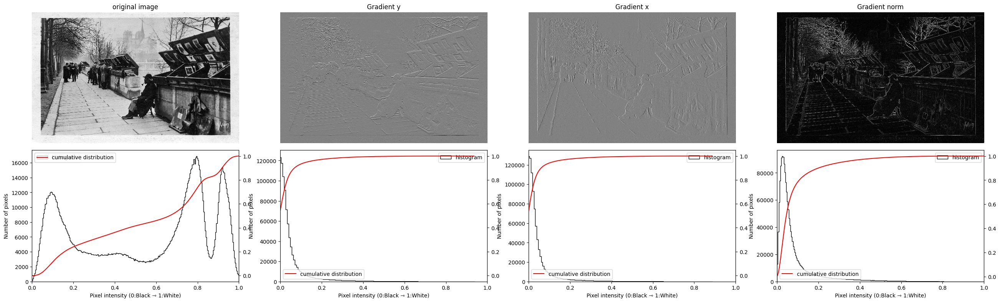

In [4]:
Ky= np.array([-1.,0.,1.])
imgRowAxis = convolve1d(imgGray,Ky,axis=0)
imgColAxis = convolve1d(imgGray,Ky,axis=1)
normGradient = np.sqrt(imgRowAxis**2+imgColAxis**2)

plotimgs_SideBySide([imgGray, imgRowAxis, imgColAxis, normGradient],imgW=8,titles=["original image","Gradient y","Gradient x", "Gradient norm"])

#### Second derivative = convolution in 2D

<div class="intro">

The Laplacian of an image, *i.e.* its "second derivative", highlights the areas of rapid changes in intensity and can thus be used for edge detection. It can be demonstrated that the Laplacian kernel can be formulated as:

$$\left(\begin{array}{ccc}
0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{array}\right)$$

It is a second order derivative mask. 
</div>

In [5]:
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
import numpy as np
from scipy.ndimage import convolve as cv
img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')


<div class="rq">

Yet, the laplacian is very sensitive to noise. We will first start by blurring the image to remove noise.
</div>

In [6]:
Kblur = kernel2D(5)
Kblur
image_blurred = cv(imgGray,Kblur,mode='nearest')

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]])

<div class="intro">

The laplacian will now be applied to the blurred image. 
</div>

array([[ 0,  1,  0],
       [ 1, -4,  1],
       [ 0,  1,  0]])

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


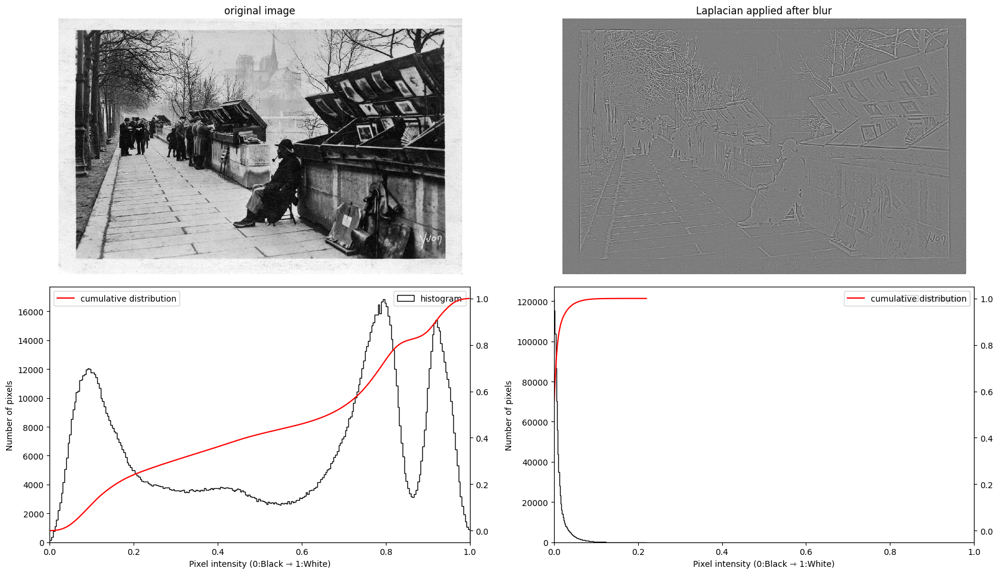

In [7]:
Kcv = np.array([0,1,0,1,-4,1,0,1,0])
Kcv = Kcv.reshape(3,3)
Kcv
image_cv = cv(image_blurred,Kcv,mode='nearest')
plotimgs_SideBySide([imgGray, image_cv],imgW=10,titles=["original image","Laplacian applied after blur"])

0 247
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


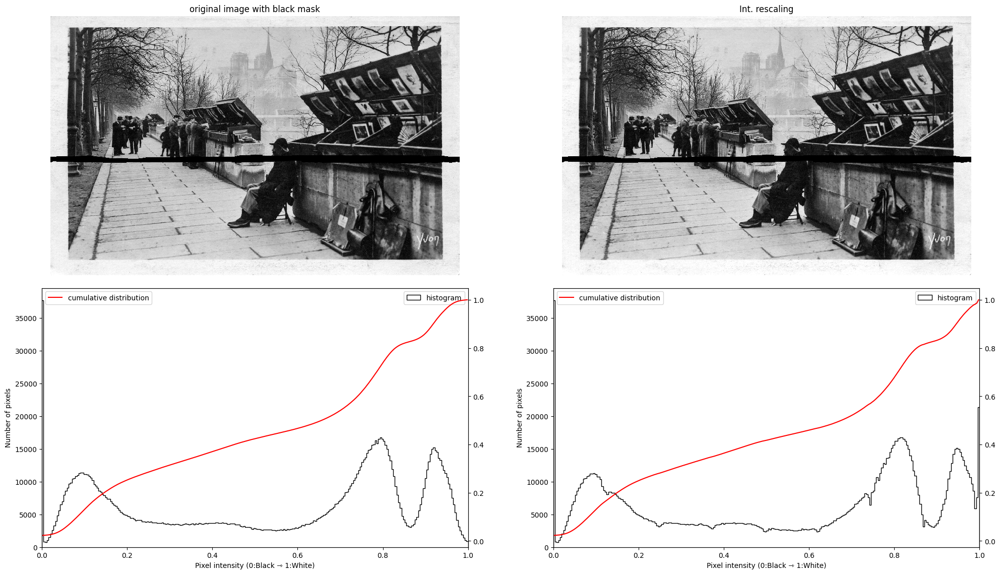

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage.color import rgb2gray
from skimage.exposure import rescale_intensity

# Contrast stretching
p1, p99 = np.uint8(np.percentile(imgTWM, (1, 99)))
print(p1,p99)
imgTWMGray_ri = rgb2gray(rescale_intensity(imgTWM, in_range=(p1, p99)))

plotimgs_SideBySide([imgTWMGray, imgTWMGray_ri],imgW=12,titles=["original image with black mask","Int. rescaling"])

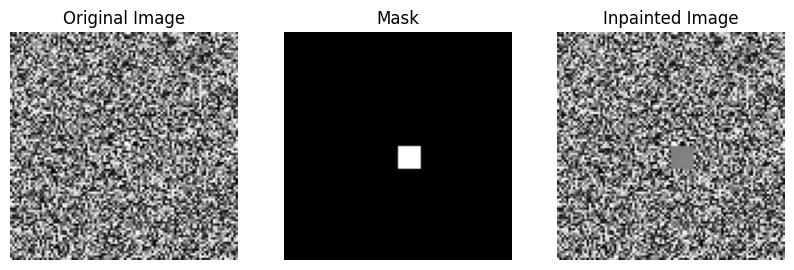

In [10]:
import numpy as np
from scipy.ndimage import convolve

def inpaint_normalized_convolution(image, mask, neighborhood_size=10):
    padded_image = np.pad(image, neighborhood_size, mode='constant')
    padded_mask = np.pad(mask, neighborhood_size, mode='constant')

    inpainted_image = np.copy(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if mask[i, j]:  # Check if pixel is missing
                neighborhood = padded_image[i:i+2*neighborhood_size+1, j:j+2*neighborhood_size+1]
                neighborhood_mask = padded_mask[i:i+2*neighborhood_size+1, j:j+2*neighborhood_size+1]

                # Compute weighted average (excluding missing pixels)
                weights = np.where(neighborhood_mask, 0, 1)
                inpainted_image[i, j] = np.sum(neighborhood * weights) / np.sum(weights)

    return inpainted_image

# Example usage
import matplotlib.pyplot as plt

# Create a sample image with a missing region
image = np.random.rand(100, 100)
mask = np.zeros_like(image)
mask[50:60, 50:60] = 1

# Inpaint the missing region
inpainted_image = inpaint_normalized_convolution(image, mask)

# Display the results
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Mask')
plt.imshow(mask, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Inpainted Image')
plt.imshow(inpainted_image, cmap='gray',vmin=0.0, vmax=1.0)
plt.axis('off')

plt.show()


The normalized convolution algorithm will be applied to a W:1600 pixels x H:1014 pixels image
(1014, 1600)


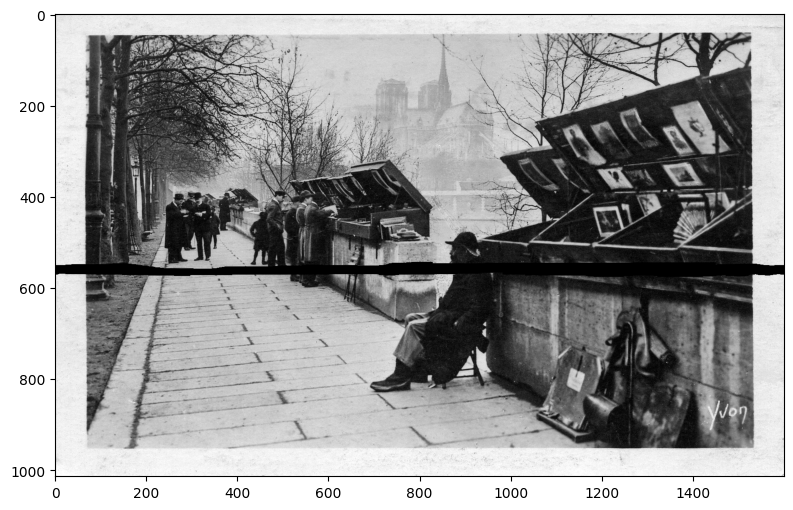

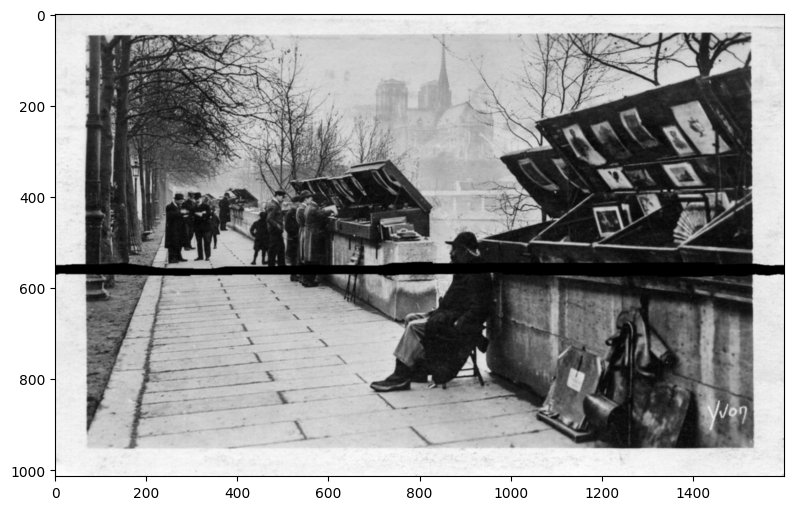

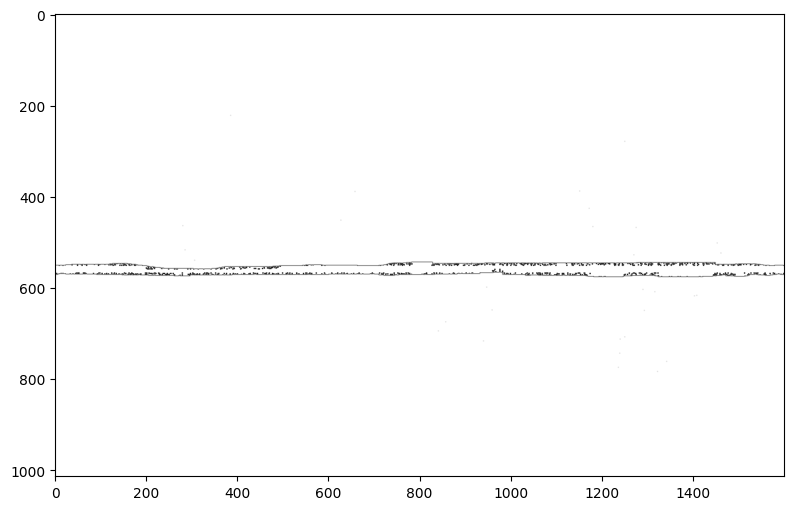

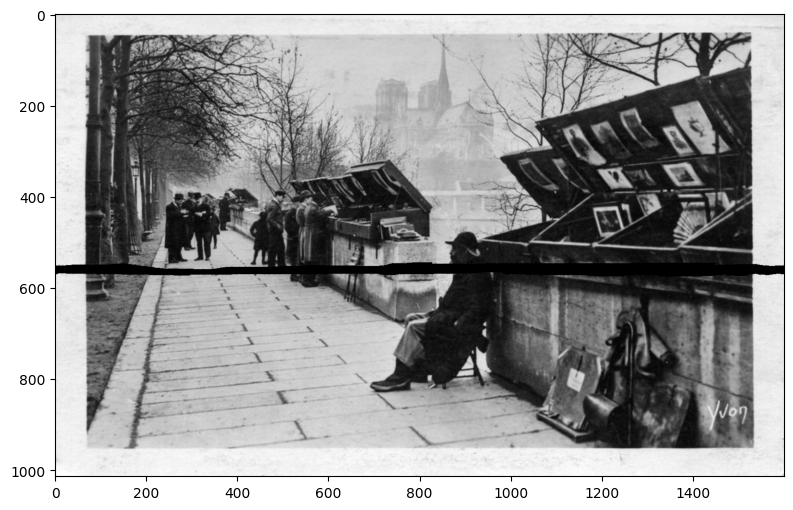

In [11]:
from scipy.ndimage import convolve as cv
kernelsize = 3
K = kernel2D(kernelsize)

H, W = imgTWMGray.shape
print(f"The normalized convolution algorithm will be applied to a W:{W} pixels x H:{H} pixels image")
np.set_printoptions(linewidth=2000)

inpainted_img = imgTWMGray.copy()
# inpainted_img = np.ones_like(imgTGray)
print(inpainted_img.shape)
plt.figure(figsize=(12,6))
plt.imshow(inpainted_img, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()

num = cv(imgTWMGray,K,mode='reflect')
den = cv(BlackMask,K,mode='reflect')
den[den == 0] = 1  # Avoid division by zero

plt.figure(figsize=(12,6))
plt.imshow(num, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
plt.figure(figsize=(12,6))
plt.imshow(den, cmap='gray',vmin=0.0, vmax=1.0)
plt.show()
ftilde = num/den
plt.figure(figsize=(12,6))
plt.imshow(ftilde, cmap='gray')
plt.show()

## Classifying 3 different geometrical shapes

### Import stuff

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# file management imports
import os  ### only for count of images from dir, can be removed later
import tensorflow as tf
# model imports for deep learning
from keras import Input, layers, models, regularizers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score
import cv2
from sklearn import metrics
#for confusion matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import itertools
from sklearn.metrics import ConfusionMatrixDisplay

#for displaying images when predicting class
from PIL import Image, ImageOps
#for rounding up fitting model for steps_per_epoch
import math

from keras.models import load_model
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.callbacks import ReduceLROnPlateau
#from google.colab import drive

# Ticks stuff for matplotlib
import matplotlib.ticker as mticker

2024-06-28 14:58:40.602328: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-28 14:58:40.603174: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-28 14:58:40.634088: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-06-28 14:58:40.742174: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-28 14:58:41.612721: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warnin

### Definition of various functions

In [9]:
#display image smaller (for checking manually)
def display_image(image_directory):
    im = image.load_img(image_directory)
    fig, ax = plt.subplots(figsize=(10,6))
    # displaying the image with figsize
    ax.imshow(im)

# Some functions for Data Augmentation
datagen = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=45
)
datagen2 = ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=False,
    vertical_flip=False,
    rotation_range=0
)

# confusion matrix plot
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion Matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Preparation of the Train, Validation and Test Sets

#### Location of the training, validation and test sets

In [10]:
train_dir = "./ML-CircSquTri/train/"
val_dir = "./ML-CircSquTri/val/"
test_dir = "./ML-CircSquTri/test/"

#### Batch Size Definition + Image size definition

In [11]:
batch_size = 32
input = Input(shape=(128, 128, 1))

#### Application (or not) of image transformation 

In [12]:
train_image_generator = ImageDataGenerator(rescale=1./255.)
validation_image_generator = ImageDataGenerator(rescale=1./255.)

#making tensorflow for training data
training_data = train_image_generator.flow_from_directory(directory= train_dir,       # dataset
                                                   target_size = (128,128),      # desired dimensions for the images
                                                   batch_size = batch_size,    # it will be run in groups of(batch_size specified above)
                                                   class_mode = 'categorical', # type of classifiaction
                                                   #classes=classes, 
                                                   color_mode='grayscale',
                                                   #shuffle=False, 
                                                   )
#making tensorflow for testing data
val_data = validation_image_generator.flow_from_directory(directory= val_dir,
                                                   target_size = (128,128),
                                                   batch_size = batch_size,
                                                   class_mode = 'categorical',
                                                   #classes=classes, 
                                                   color_mode='grayscale',
                                                   #shuffle=False 
                                                   )
test_data = datagen2.flow_from_directory(directory= test_dir,
                                                   target_size = (128,128),
                                                   batch_size = batch_size,
                                                   class_mode = 'categorical',
                                                   #classes=classes, 
                                                   color_mode='grayscale',
                                                   shuffle=False 
                                                   )

Found 2005 images belonging to 3 classes.
Found 406 images belonging to 3 classes.
Found 406 images belonging to 3 classes.


### Vanilla Neural Network

#### Model Construction

In [13]:
input = Input(shape=(128, 128, 1))
x = layers.Flatten()(input)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dense(3, activation='softmax')(x)

model = models.Model(input, x)

#from tensorflow.keras.optimizers import SGD
#optimizer = SGD(learning_rate=0.1)
optimizer = 'adam'

model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=["accuracy"])
model.summary()

2024-06-28 14:58:56.233580: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:282] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     2,097,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,105,731 (8.03 MB)

 Trainable params: 2,105,731 (8.03 MB)

 Non-trainable params: 0 (0.00 B)

#### Run for 20 Epochs

In [14]:
history = model.fit(training_data, validation_data=val_data, epochs=20)

Epoch 1/20
 5/63 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.3075 - loss: 7.0746  

/home/romuald/Python3/ML/lib/python3.11/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - accuracy: 0.3981 - loss: 5.2721 - val_accuracy: 0.6256 - val_loss: 0.7325
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6086 - loss: 1.0061 - val_accuracy: 0.6872 - val_loss: 0.7163
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6225 - loss: 0.9559 - val_accuracy: 0.5369 - val_loss: 1.0489
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6963 - loss: 0.7431 - val_accuracy: 0.6773 - val_loss: 0.9738
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.7060 - loss: 0.8084 - val_accuracy: 0.7537 - val_loss: 0.6248
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7148 - loss: 0.7742 - val_accuracy: 0.7315 - val_loss: 0.7020
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7534 - loss: 0.5841 - val_accuracy: 0.5369 - val_loss: 1.2716
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.7523 - loss: 0.5917 - val_accuracy: 0.7241 - val_loss: 0.

#### Analysis of the Results 

In [17]:
accuracy = history.history['accuracy'][1:]
loss = history.history['loss'][1:]
val_accuracy = history.history['val_accuracy'][1:]
val_loss = history.history['val_loss'][1:]

##### Plot Accuracy and Validation Accuracy curve

Text(0.5, 0, '# Epochs')

(0.0, 19.0)

(0.0, 1.0)

Text(0, 0.5, '')

Text(0.5, 1.0, 'Accuracy and Validation Accuracy wrt Epochs')

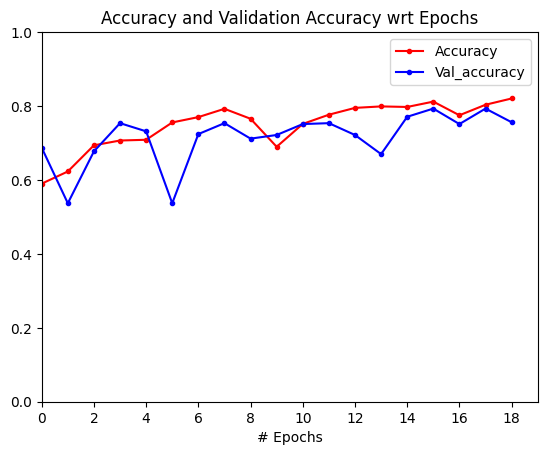

In [18]:
#plot accuracy for model
plt.plot(range(len(accuracy)), accuracy, 'r', marker= '.', label = 'Accuracy')
#plot loss for model
plt.plot(range(len(val_accuracy)), val_accuracy, 'b', marker= '.', label = 'Val_accuracy')
plt.xlabel('# Epochs')
plt.xlim(0,19)
plt.ylim(0.,1.00)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(2))
plt.ylabel('')
plt.title('Accuracy and Validation Accuracy wrt Epochs')
plt.legend()

##### Plot Loss and and Validation 

Text(0.5, 0, '# Epochs')

Text(0, 0.5, '')

(0.0, 19.0)

(0.0, 1.2)

Text(0.5, 1.0, 'Loss and Validation Loss wrt Epochs')

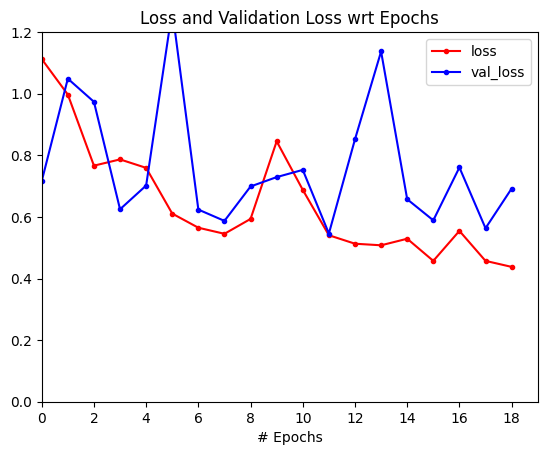

In [19]:
plt.plot(range(len(loss)), loss, 'r', marker= '.', label = 'loss')
#plot loss for model
plt.plot(range(len(val_loss)), val_loss, 'b', marker= '.', label = 'val_loss')
plt.xlabel('# Epochs')
plt.ylabel('')
plt.xlim(0,19)
plt.ylim(0.0,1.2)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(2))
plt.title('Loss and Validation Loss wrt Epochs')
plt.legend()

#### Test the Model

##### Prediction

In [20]:
true_classes = test_data.classes
class_labels = list(test_data.class_indices.keys())
print(class_labels)
print(true_classes)
#test_data
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)

['circle', 'square', 'triangle']
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


##### Confusion matrix

Normalized confusion matrix
[[0.53543307 0.18110236 0.28346457]
 [0.00769231 0.7        0.29230769]
 [0.00671141 0.         0.99328859]]


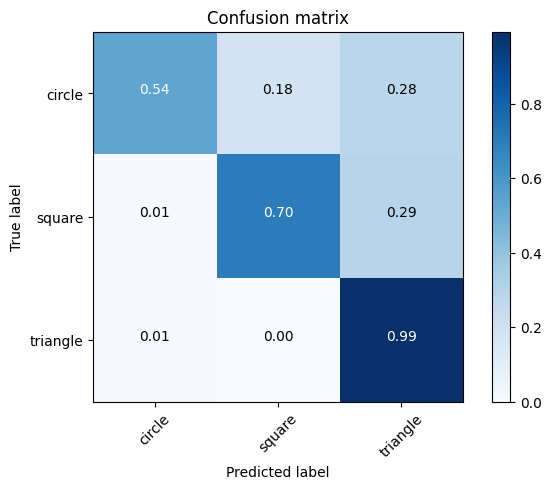

In [21]:
cm = metrics.confusion_matrix(true_classes, predicted_classes)
plot_confusion_matrix(cm,['circle', 'square', 'triangle'])

### Convolutional Neural Network (CNN)

#### Model construction

In [22]:
input = Input(shape=(128, 128, 1))
#x = layers.Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(256, 256, 3), kernel_regularizer=regularizers.L2(0.01))(input)
x = layers.Conv2D(16, kernel_size=(3, 3), activation='relu', padding = 'same', input_shape=(128, 128, 1))(input)

x = layers.MaxPool2D((2, 2))(x)
x = layers.Dropout(0.3)(x)


x = layers.Conv2D(16, kernel_size=(3, 3), activation='relu', padding = 'same')(x)
x = layers.MaxPool2D((2, 2))(x)
x = layers.Dropout(0.3)(x)

x = layers.Flatten()(x)
x = layers.Dense(32, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(3, activation='softmax')(x)

model = models.Model(input, x)

#from tensorflow.keras.optimizers import SGD
#optimizer = SGD(learning_rate=0.1)
optimizer = 'adam'

model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=["accuracy"])
model.summary()

/home/romuald/Python3/ML/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 16)   │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 16)     │         2,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 32, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │       524,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │            99 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 526,899 (2.01 MB)

 Trainable params: 526,899 (2.01 MB)

 Non-trainable params: 0 (0.00 B)

#### Run for 20 Epochs

In [23]:
history = model.fit(training_data, validation_data=val_data, epochs=20)

Epoch 1/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.3292 - loss: 1.2752 - val_accuracy: 0.3867 - val_loss: 1.0945
Epoch 2/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.3593 - loss: 1.0854 - val_accuracy: 0.4286 - val_loss: 1.0367
Epoch 3/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.4429 - loss: 1.0078 - val_accuracy: 0.4335 - val_loss: 0.9331
Epoch 4/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.5837 - loss: 0.8504 - val_accuracy: 0.5813 - val_loss: 0.8252
Epoch 5/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.6628 - loss: 0.7732 - val_accuracy: 0.7635 - val_loss: 0.7695
Epoch 6/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.7211 - loss: 0.7129 - val_accuracy: 0.7833 - val_loss: 0.7411
Epoch 7/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.7184 - loss: 0.6976 - val_accuracy: 0.7808 - val_loss: 0.7153
Epoch 8/20
63/63 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - accuracy: 0.7365 - loss: 0.6716 - val_accuracy: 0.7709 - v

#### Analysis of the Results 

In [29]:
accuracy = history.history['accuracy'][1:]
loss = history.history['loss'][1:]
val_accuracy = history.history['val_accuracy'][1:]
val_loss = history.history['val_loss'][1:]

##### Plot Accuracy and Validation Accuracy curve

Text(0.5, 0, '# Epochs')

(0.0, 19.0)

(0.7, 1.0)

Text(0, 0.5, '')

Text(0.5, 1.0, 'Accuracy and Validation Accuracy wrt Epochs')

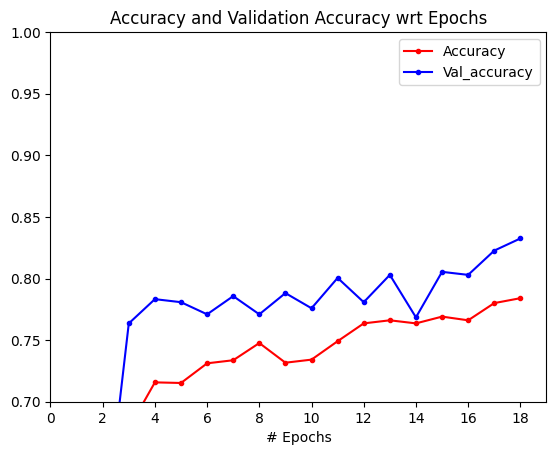

In [30]:
#plot accuracy for model
plt.plot(range(len(accuracy)), accuracy, 'r', marker= '.', label = 'Accuracy')
#plot loss for model
plt.plot(range(len(val_accuracy)), val_accuracy, 'b', marker= '.', label = 'Val_accuracy')
plt.xlabel('# Epochs')
plt.xlim(0,19)
plt.ylim(0.70,1.00)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(2))
plt.ylabel('')
plt.title('Accuracy and Validation Accuracy wrt Epochs')
plt.legend()

##### Plot Loss and and Validation 

Text(0.5, 0, '# Epochs')

Text(0, 0.5, '')

(0.0, 19.0)

(0.0, 0.6)

Text(0.5, 1.0, 'Loss and Validation Loss wrt Epochs')

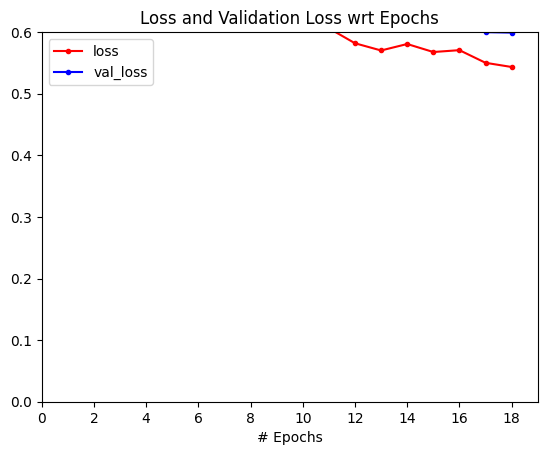

In [31]:
plt.plot(range(len(loss)), loss, 'r', marker= '.', label = 'loss')
#plot loss for model
plt.plot(range(len(val_loss)), val_loss, 'b', marker= '.', label = 'val_loss')
plt.xlabel('# Epochs')
plt.ylabel('')
plt.xlim(0,19)
plt.ylim(0.0,0.6)
plt.gca().xaxis.set_major_locator(mticker.MultipleLocator(2))
plt.title('Loss and Validation Loss wrt Epochs')
plt.legend()

#### Test the Model

##### Prediction

In [32]:
true_classes = test_data.classes
class_labels = list(test_data.class_indices.keys())
print(class_labels)
print(true_classes)
#test_data
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)
print(predicted_classes)

['circle', 'square', 'triangle']
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0

##### Confusion matrix

Normalized confusion matrix
[[0.63779528 0.20472441 0.15748031]
 [0.02307692 0.86923077 0.10769231]
 [0.         0.03355705 0.96644295]]


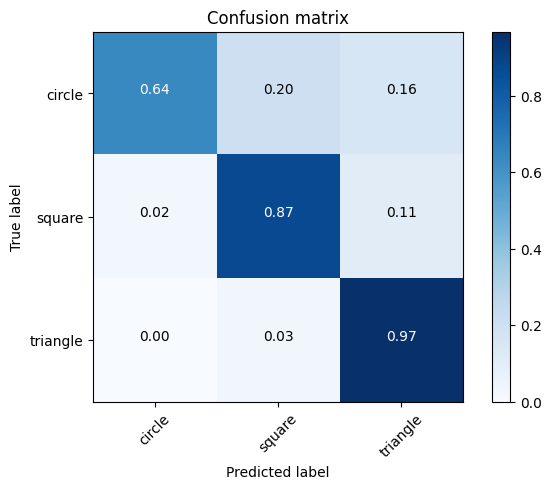

In [33]:
cm = metrics.confusion_matrix(true_classes, predicted_classes)
plot_confusion_matrix(cm,['circle', 'square', 'triangle'])

#### Can you do better ?

## Building an image classifier using the Keras sequential API

In [34]:
import sklearn
import tensorflow as tf

import matplotlib.pyplot as plt

plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

### Useful functions

<div class="intro">
    
Let's create an `ML-SavedFigures` folder (if it doesn't already exist), and define the `save_fig()` function which is used through this notebook to save the figures in high-res
</div>

In [35]:
from pathlib import Path

IMAGES_PATH = Path() / "ML-SavedFigures"
IMAGES_PATH.mkdir(parents=True, exist_ok=True)

def save_fig(fig_id, IMAGES_PATH=".", tight_layout=True, fig_extension="png", resolution=300):
    '''
    saves a figure to a given subfolder, that will be created if it does not exist
    input:
        - fig_id = name of the figure, without an extension
        - IMAGES_PATH = pathway to the folder. Default: "."
        - tight_layout = boolean. Automatically adjusts subplot params so that the subplot(s) fits in to the figure area. Default: True
        - fig_extension = image type. Default: png
        - resolution = resolution of the figure, in dpi. Default: 300
    '''
    path = IMAGES_PATH / f"{fig_id}.{fig_extension}"
    if tight_layout:
        plt.tight_layout()
    plt.savefig(path, format=fig_extension, dpi=resolution)

def plotFashionToGrid(X, y, fashion_names, nrows=5, ncols=8, startFrom=0, yActual=None, saveFig = False, IMAGES_PATH="."):
    '''
    plots nrows x ncols images with plt.imshow(), with their label as title
    input:
        - X = array with nimg b&w images coded as (npix,npix). Size = (nimg, npix, npix)  
        - y = 1D array made of nimg integers = class number
        - fashion_names = array with the corresponding class names
        - nrows, ncols = dimension of the plot grid (nrows x ncols must be <= nimg)
        - startFrom = index of the first image that will be shown
        - yActual = only useful when evaluating a prediction. It will contain the
          actual integer labels of the images
          In this case, y must be set to the value predicted by the model
          When a prediction is wrong, the label will be shown in red
        - saveFig = saves the figure to IMAGES_PATH
        - IMAGES_PATH = pathway to save images. Default: "."
    '''
    from matplotlib import pyplot as plt
    plt.rc('font', size=14)
    plt.rc('axes', labelsize=14, titlesize=12)
    plt.rc('legend', fontsize=14)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.figure(figsize=(ncols * 1.2, nrows * 1.2))
    nimg = nrows * ncols
    if nimg > len(y) - startFrom:
        print(f"Sample size = {len(y)}. Cannot plot {nrows} x {ncols} = {nimg} images, with startFrom set as {startFrom}")
        print(f"startFrom automatically setup to {len(y) - nimg}")
        startFrom = len(y) - nimg
    for row in range(nrows):
        for col in range(ncols):
            index = ncols * row + col + startFrom
            plt.subplot(nrows, ncols, index + 1 - startFrom) # the third argument represents the index of the subplot that will be used
            plt.imshow(X[index], cmap="binary", interpolation="nearest",vmin=0.0, vmax=1.0) # the data X is resampled to the pixel size of the image on the figure canvas, using the "nearest" interpolation method
            plt.axis('off')
            colorTitle = 'black'
            if yActual is not None and yActual[index] != y[index]:
                colorTitle='red'
            plt.title(fashion_names[y[index]],color=colorTitle)
    plt.subplots_adjust(wspace=0.2, hspace=0.5)
    if (saveFig):
        save_fig(IMAGES_PATH,"fashion_mnist_grid")
    plt.show()

def plot_metrics(historyDf, saveFig=False, IMAGES_PATH="."):
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np
    
    nepochs = historyDf.shape[0]
    maxl = np.max(historyDf["loss"])
    maxvl = np.max(historyDf["val_loss"])
    maxac = np.max(historyDf["accuracy"])
    maxvac = np.max(historyDf["val_accuracy"])
    max = np.max([maxl,maxvl,maxac,maxvac])+0.1
    historyDf.plot(
        figsize=(8, 5), xlim=[0, nepochs], ylim=[0, max], grid=False, xlabel="Epoch",
        style=["C0--v", "C0--p", "C1-v", "C1-p"])
    plt.axhline(y=1, color="black", linestyle="--", lw=1)
    plt.legend()
    if (saveFig):
        save_fig(IMAGES_PATH, "fashion_mnist_plot_epochs")  # extra code
    plt.show()
    return

def plotConfusionMatrix(y_trainC, y_trainC_hat, y_valC, y_valC_hat, y_testC, y_testC_hat, uv, saveFig=False, IMAGES_PATH="."):
    from sklearn.metrics import ConfusionMatrixDisplay
    from sklearn.metrics import confusion_matrix
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import seaborn as sns
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import mean_absolute_error
    from sklearn.metrics import mean_squared_error
    import numpy as np
    
    cm_labels = uv
    # this will give large numbers. Not very convenient
    cm_trs = confusion_matrix(y_trainC, np.argmax(y_trainC_hat,axis=1))
    cm_vls = confusion_matrix(y_valC, np.argmax(y_valC_hat,axis=1))
    cm_tts = confusion_matrix(y_testC, np.argmax(y_testC_hat,axis=1))

    # print(cm_trs)
    # print(cm_trs.sum(axis=1))
    # print(cm_trs.sum(axis=1).reshape(len(cm_labels),1))

    # transform into percentage
    cm_trs = 100.0*cm_trs.astype("float")/cm_trs.sum(axis=1).reshape(len(cm_labels),1)
    cm_vls = 100.0*cm_vls.astype("float")/cm_vls.sum(axis=1).reshape(len(cm_labels),1)
    cm_tts = 100.0*cm_tts.astype("float")/cm_tts.sum(axis=1).reshape(len(cm_labels),1)

    fig=plt.figure(figsize=(21,6))
    plt.rc('font', size=10)
    plt.rc('axes', labelsize=14, titlesize=12)
    plt.rc('legend', fontsize=14)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    gs = gridspec.GridSpec(nrows=1, ncols=3, width_ratios=[1, 1, 1])
    
    ax00 = fig.add_subplot(gs[0, 0], title="Training set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_trs, columns=cm_labels, index=cm_labels), ax=ax00, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax00.set_xlabel("predicted", fontsize = 14)
    ax00.set_ylabel("real", fontsize = 14)
    
    ax01 = fig.add_subplot(gs[0, 1], title="Validation set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_vls, columns=cm_labels, index=cm_labels), ax=ax01, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax01.set_xlabel("predicted", fontsize = 14)
    ax01.set_ylabel("real", fontsize = 14)
    
    ax02=fig.add_subplot(gs[0, 2], title="Test set. Confusion Matrix")
    sns.heatmap(pd.DataFrame(cm_tts, columns=cm_labels, index=cm_labels), ax=ax02, cmap=plt.cm.Blues, annot = True, fmt='.1f')
    ax02.set_xlabel("predicted", fontsize = 14)
    ax02.set_ylabel("real", fontsize = 14)
    plt.show()

    atrs = accuracy_score(y_trainC,np.argmax(y_trainC_hat,axis=1))
    avls = accuracy_score(y_valC,np.argmax(y_valC_hat,axis=1))
    atts = accuracy_score(y_testC,np.argmax(y_testC_hat,axis=1))
    maetrs = mean_absolute_error(y_trainC,np.argmax(y_trainC_hat,axis=1))
    maevls = mean_absolute_error(y_valC,np.argmax(y_valC_hat,axis=1))
    maetts = mean_absolute_error(y_testC,np.argmax(y_testC_hat,axis=1))
    msetrs = mean_squared_error(y_trainC,np.argmax(y_trainC_hat,axis=1))
    msevls = mean_squared_error(y_valC,np.argmax(y_valC_hat,axis=1))
    msetts = mean_squared_error(y_testC,np.argmax(y_testC_hat,axis=1))
    print(f"{hl.BOLD}{fg.BLUE}                     Accuracy      MAE         MSE")
    print(f"{hl.BOLD}{fg.PURPLE}   Training set.      {atrs:.2f}        {maetrs:.2f}        {msetrs:.2f}")
    print(f"{hl.BOLD}{fg.DARKGRAY} Validation set.      {avls:.2f}        {maevls:.2f}        {msevls:.2f}")
    print(f"{hl.BOLD}{fg.GREEN}       Test set.      {atts:.2f}        {maetts:.2f}        {msetts:.2f}")

    if saveFig:
        save_fig(IMAGES_PATH,"fashion_mnist_confusionMatrices")
    return

def SobelBW(imgDataSet,mode='reflect'):
    '''
    Apply the Sobel filter to a grayscale image, using the 'reflect' mode of convolve by default
    input:
        imgDataSet = grayscale dataset of images
        mode = determines how the input array is extended beyond its boundaries
               {‘reflect’, ‘constant’, ‘nearest’, ‘mirror’, ‘wrap’} (see scipy.ndimage.convolve)
    output:
        image convolved by the Sobel kernel
    '''
    import numpy as np
    from scipy.ndimage import convolve
    Sobel = np.array([-1, -2, -1,0,0,0,1,2,1])
    Sobel=Sobel.reshape(3,3)
    imgS = []
    for img in imgDataSet:
         imgS.append(convolve(img,Sobel,mode=mode))
    imgS=np.array(imgS)
    return imgS

def reshapeForConv2D(X):
    '''
    the conv2D layer of keras read a 4D tensor with shape: `(batch_size, image_size1, image_size2, channels)`
    this function reshapes an (k,m,n) tensor into a (k,m,n,1) tensor
    '''
    print(f"Shape before = {X.shape}")
    Xreshaped = X.reshape(X.shape[0],X.shape[1],X.shape[2],1)
    Xreshaped.shape
    print(f" Shape after = {Xreshaped.shape}")
    return Xreshaped

### MNIST data

#### Read the fashion MNIST dataset

<div class="intro">

Let's start by loading the [fashion MNIST dataset](https://github.com/zalandoresearch/fashion-mnist). Keras has a number of functions to load popular datasets in `tf.keras.datasets`. The dataset is **already split** between a training set (60,000 images) and a test set (10,000 images), but it can be useful to split the training set further to have a validation set. We'll use 55,000 images for training, and 5,000 for validation.

</div>

In [36]:
fashion_mnist = tf.keras.datasets.fashion_mnist.load_data()
len(fashion_mnist)
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist

2

<div class="intro">

The training and test sets contain 60000 and 10000 grayscale images, each 28x28 pixels.

Each pixel intensity of the input (`X`) sets is represented as a byte (0 to 255). The labels (`y`) are the class IDs (represented as `uint8`), from 0 to 9. Each training and test example is indeed assigned to one of the following labels:

|label|description|
|:-----|:------------|
|0|	T-shirt/top|
|1|	Trouser|
|2|	Pullover|
|3|	Dress|
|4|	Coat|
|5|	Sandal|
|6|	Shirt|
|7|	Sneaker|
|8|	Bag|
|9|	Ankle boot|

</div>

(60000, 28, 28)

(60000,)

(10000, 28, 28)

(10000,)

dtype('uint8')

dtype('uint8')

array([[  0,   0,   0,   0,   0,   0,   0,   0,   6, 123,  88, 103,  54,
         26,  95,  84,  91,  92, 122,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,  85, 228, 210, 212, 199,
        179, 253, 209, 213, 208, 220,  56,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 100, 214, 194, 198, 204,
        207, 200, 197, 196, 193, 207,  85,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 114, 212, 199, 200, 197,
        194, 192, 198, 197, 196, 207,  98,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 131, 228, 194, 199, 198,
        197, 192, 197, 197, 194, 233, 100,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0, 149, 222, 192, 197, 196,
        198, 193, 196, 196, 190, 223, 125,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

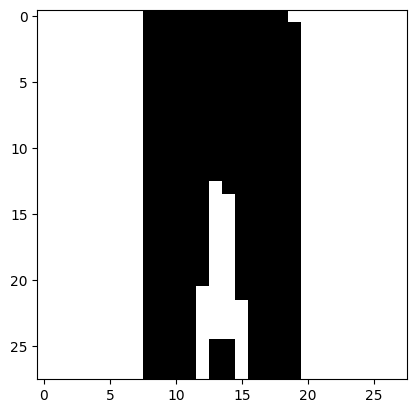

1

In [37]:
t4pPC.centerTitle("Shapes")
X_train_full.shape
y_train_full.shape
X_test.shape
y_test.shape

t4pPC.centerTitle("Types")
X_train_full.dtype
y_train_full.dtype

t4pPC.centerTitle("1st image")
display(X_train_full[2325])
plt.imshow(X_train_full[2325], cmap="binary",vmin=0.0, vmax=1.0); plt.show()
display(y_train_full[2325])

<div class="rqT" title="Integer numbers in computer science">

In computer science, an integer is a data type that represents some range of mathematical integers. Common integer types are reported below, with their range

|bits|name|range|
|----:|------:|:------|
|4|`int4`|[-8,7]|
|4|`uint4`|[0,15]|
|8|`int8`|[-128,127]|
|8|`uint8`|[0,255]|
|16|`int16`|[-32768,32767]|
|16|`uint16`|[0,65535]|
|32|`int32`|[-2 147 483 648,2 147 483 647]|
|32|`uint32`|[0,4 294 967 295]|

- signed integral type with *n* bits represent numbers in the range [−2<sup>*n*−1</sup>, 2<sup>*n*−1</sup>−1]
- unsigned integral type with *n* bits represent numbers in the range [0, 2<sup>*n*</sup>−1]
</div>

<div class="intro">

Let's now define the 10 class names in a `fashion_names` list
</div>

In [38]:
fashion_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat",
               "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
nclass = len(fashion_names)

#### Standardization of the data

<div class="intro">

For simplicity, let's scale the pixel intensities down to the 0-1 range and convert them to floats, by dividing by 255.0

</div>

In [39]:
X_train_full = X_train_full/255.0
X_test = X_test/255.0

#### Plot a sample of the images

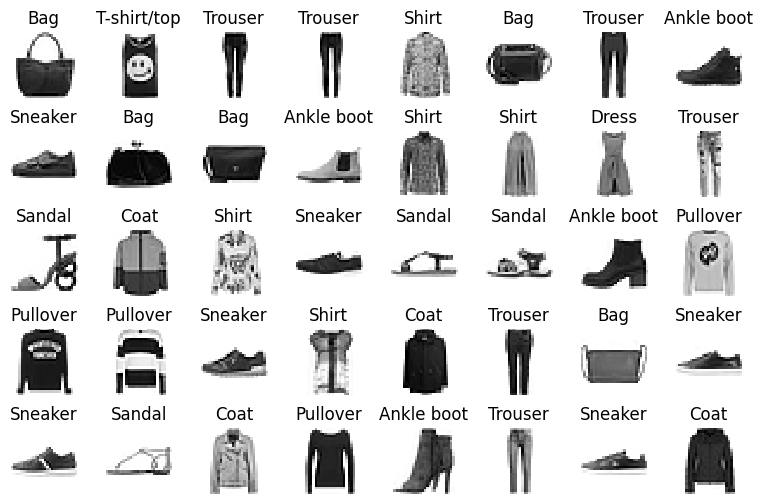

In [40]:
plotFashionToGrid(X_train_full, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)

#### Make the training, validation and test sets

In [41]:
X_train, y_train = X_train_full[:-5000], y_train_full[:-5000]
X_valid, y_valid = X_train_full[-5000:], y_train_full[-5000:]
t4pPC.centerTitle("Training set")
X_train.shape
y_train.shape
t4pPC.centerTitle("Validation set")
X_valid.shape
y_valid.shape
t4pPC.centerTitle("Test set")
X_test.shape
y_test.shape

(55000, 28, 28)

(55000,)

(5000, 28, 28)

(5000,)

(10000, 28, 28)

(10000,)

### Supervised learning of the fashion MNIST database, with a simple DNN

#### Creation and compilation of the model

<div class="rq">

Keras manages a global state, which it uses to implement the Functional model-building API and to uniquify autogenerated layer names.

If you are creating many models in a loop, this global state will consume an increasing amount of memory over time, and you may want to clear it. [Calling `clear_session()`](https://www.tensorflow.org/api_docs/python/tf/keras/backend/clear_session) releases the global state: this helps avoid clutter from old models and layers, especially when memory is limited.

</div>

/home/romuald/Python3/ML/lib/python3.11/site-packages/keras/src/layers/core/input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │        78,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         2,020 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,730 (315.35 KB)

 Trainable params: 80,730 (315.35 KB)

 Non-trainable params: 0 (0.00 B)

[<Flatten name=flatten, built=True>,
 <Dense name=dense, built=True>,
 <Dropout name=dropout, built=True>,
 <Dense name=dense_1, built=True>,
 <Dense name=dense_2, built=True>]

array([[ 0.07895666, -0.02145047, -0.04212867, ...,  0.05148262,
         0.01851576, -0.00970694],
       [-0.05202203,  0.06487896,  0.04011139, ...,  0.02775498,
         0.0570842 , -0.02589579],
       [-0.00481369,  0.0574861 ,  0.05874498, ..., -0.06009376,
         0.01449176,  0.06981961],
       ...,
       [-0.01161509, -0.0039428 , -0.00171918, ..., -0.05646645,
         0.01783475, -0.01415218],
       [-0.01530251,  0.00999826,  0.06579174, ..., -0.07599913,
        -0.03127977, -0.02249279],
       [ 0.03070375, -0.04992892,  0.07288787, ..., -0.05247109,
        -0.01378394,  0.03491744]], dtype=float32)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

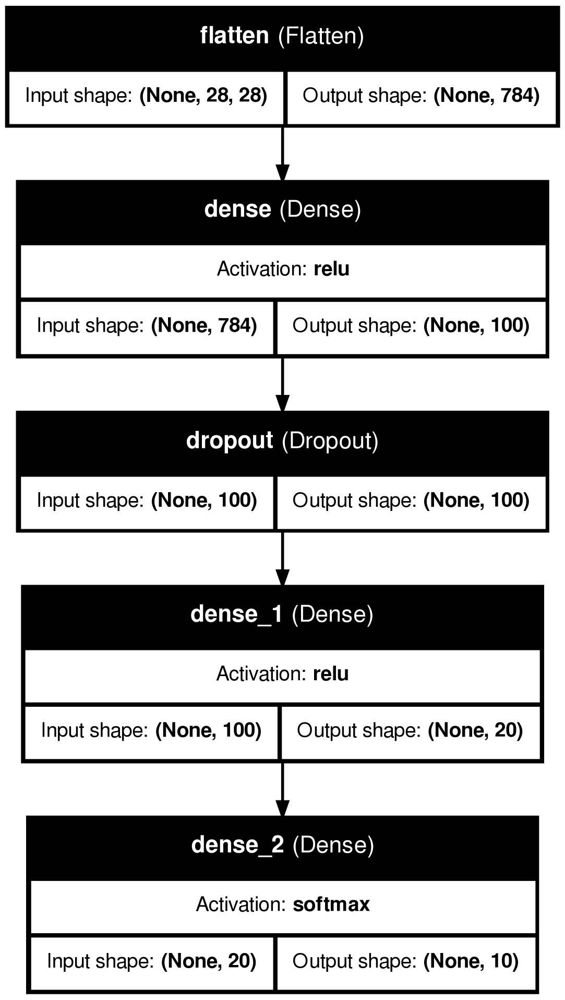

In [42]:
tf.keras.backend.clear_session()

model = tf.keras.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=[28, 28]))
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(100, activation="relu"))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(20, activation="relu"))
model.add(tf.keras.layers.Dense(nclass, activation="softmax"))

t4pPC.centerTitle("Summary of the model")
model.summary()

t4pPC.centerTitle("Layers")
model.layers
hidden1 = model.layers[1]
weights, biases = hidden1.get_weights()
weights
biases

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, show_layer_activations=True)

<div class="rqT" title = "Sparse categorical crossentropy">

Categorical_crossentropy (`cce`) produces a one-hot array containing the probable match for each category

Sparse_categorical_crossentropy (`scce`) produces a category index of the most likely matching category. It is also named *Softmax Loss*. It is a *Softmax* activation plus a *Cross-Entropy* loss

**Consider a classification problem with 5 categories (or classes)**

- in the case of `cce`, the one-hot target may be `[0, 1, 0, 0, 0]` and the model may predict `[.2, .5, .1, .1, .1]`, which is probably right given that the 0.5 probablity is significantly higher than the other numbers
- in the case of `scce`, the target index may be `[1]` and the model may predict: `[.5]`

**Consider now a classification problem with 3 classes**

- in the case of `cce`, the one-hot target might be `[0, 0, 1]` and the model may predict `[.5, .1, .4]`, which is probably inaccurate, given that it gives more probability to the first class
- in the case of `scce`, the target index might be `[0]`, and the model may predict `[.5]`

Many categorical models produce `scce` output because you save space, but **lose a lot of information** (for example, in the 2nd example, index 2 was also very close.)

**There are a number of situations to use `scce`, including**

- when your classes are mutually exclusive, i.e. you don’t care at all about other close-enough predictions,
- the number of categories is large to the prediction output becomes overwhelming
</div>
<br>
<div class="rqT" title="Stochastic Gradient Descent (SGD)">
</div>

In [43]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)
model.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

#### Training

In [44]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
history = model.fit(X_train, y_train,
                    epochs = 30,
                    validation_data=(X_valid, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

Epoch 1/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.6972 - loss: 0.8236 - val_accuracy: 0.8360 - val_loss: 0.4407 - learning_rate: 0.1000
Epoch 2/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8260 - loss: 0.4743 - val_accuracy: 0.8474 - val_loss: 0.4115 - learning_rate: 0.1000
Epoch 3/30
1677/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8449 - loss: 0.4211
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8448 - loss: 0.4213 - val_accuracy: 0.8510 - val_loss: 0.3896 - learning_rate: 0.1000
Epoch 4/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8595 - loss: 0.3831 - val_accuracy: 0.8690 - val_loss: 0.3518 - learning_rate: 0.0500
Epoch 5/30
1704/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8654 - loss: 0.3626
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8654 - loss: 0

In [47]:
t4pPC.centerTitle("history.params")
history.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyDf = pd.DataFrame(history.history)
display(historyDf)

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.768164,0.631457,0.8360,0.440695,0.100000
1,0.827564,0.470165,0.8474,0.411529,0.100000
2,0.842655,0.427817,0.8510,0.389623,0.100000
3,0.861509,0.377544,0.8690,0.351757,0.050000
4,0.865309,0.366599,0.8724,0.348913,0.050000
5,0.873891,0.345852,0.8776,0.336551,0.025000
6,0.875127,0.339929,0.8760,0.328848,0.025000
7,0.878909,0.327957,0.8786,0.328043,0.012500
8,0.880036,0.325301,0.8802,0.327614,0.012500
9,0.883345,0.320020,0.8812,0.323575,0.006250


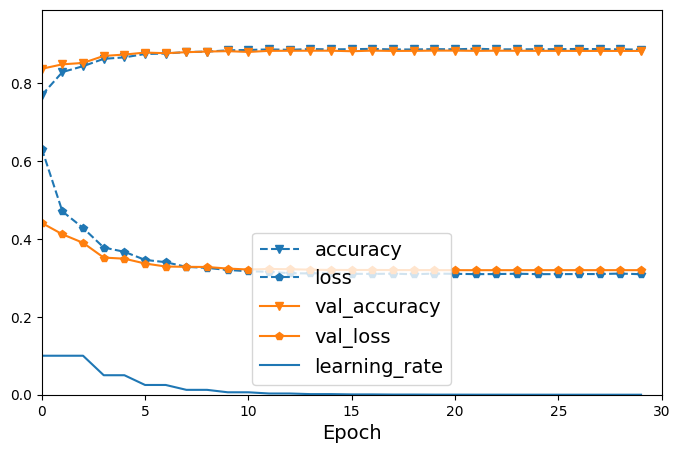

In [48]:
plot_metrics(historyDf)

#### Evaluation of the accuracy

In [49]:
t4pPC.centerTitle("training set")
model.evaluate(X_train, y_train)
t4pPC.centerTitle("validation set")
model.evaluate(X_valid, y_valid)
t4pPC.centerTitle("test set")
model.evaluate(X_test, y_test)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 928us/step - accuracy: 0.8979 - loss: 0.2718


[0.27371707558631897, 0.8980727195739746]

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 838us/step - accuracy: 0.8759 - loss: 0.3269


[0.3194911479949951, 0.8817999958992004]

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 847us/step - accuracy: 0.8776 - loss: 0.3420


[0.3471316397190094, 0.8744000196456909]

#### Prediction and comparison with the actual class

##### Selection of images of the test set

In [50]:
startFrom = 0
ncols = 8
nrows = 5
X_new = X_test[startFrom:ncols*nrows]
y_new = y_test[startFrom:ncols*nrows]
y_hat = model.predict(X_new)
y_hat.round(2)
y_pred = y_hat.argmax(axis=1)
y_pred

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


array([[0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.02, 0.  , 0.98],
       [0.  , 0.  , 0.99, 0.  , 0.  , 0.  , 0.01, 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.11, 0.  , 0.05, 0.  , 0.01, 0.  , 0.82, 0.  , 0.  , 0.  ],
       [0.  , 1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.01, 0.  , 0.98, 0.  , 0.01, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.04, 0.  , 0.96, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  ],
       [0.  , 0.  , 0.18, 0.  , 0.74, 0.  , 0.08, 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 1.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.  , 0.  , 0.  , 0.47, 0.  , 0.47, 0.06, 0.  ],
       [0.  , 0.  , 0.  , 0.99, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 0.  , 0.08, 0.  , 0.

array([9, 2, 1, 1, 6, 1, 4, 6, 5, 7, 4, 5, 7, 3, 4, 1, 2, 2, 8, 0, 2, 7,
       7, 5, 1, 2, 6, 0, 9, 4, 8, 8, 3, 3, 8, 0, 7, 5, 7, 9])

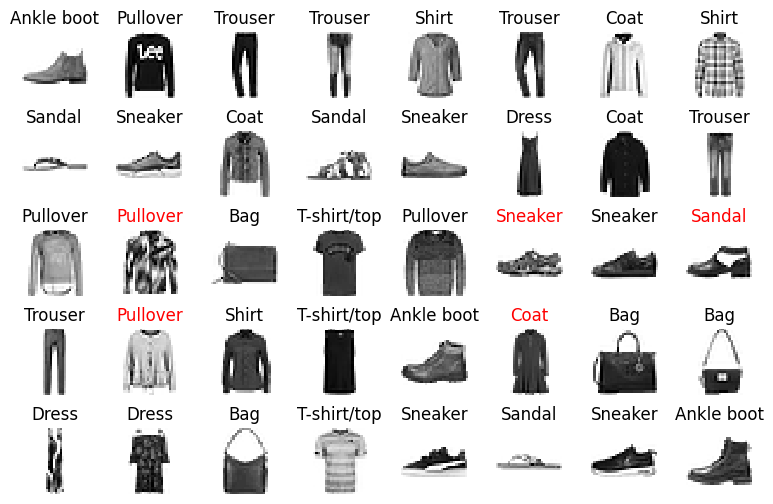

In [51]:
plotFashionToGrid(X_new, y_pred, fashion_names, nrows=nrows, ncols=ncols, startFrom=startFrom, yActual=y_new)

##### Confusion matrices

In [52]:
y_train_hat = model.predict(X_train)
y_valid_hat = model.predict(X_valid)
y_test_hat = model.predict(X_test)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


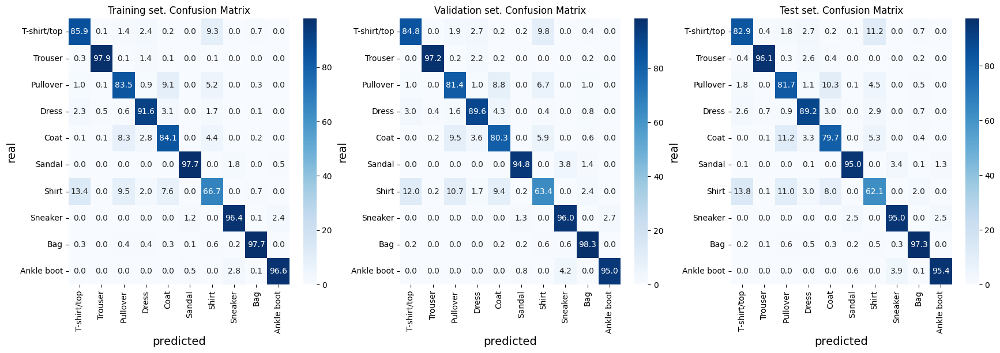

                     Accuracy      MAE         MSE
   Training set.      0.90        0.34        1.45
 Validation set.      0.88        0.37        1.49
       Test set.      0.87        0.41        1.69


In [53]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

### Supervised learning of the fashion MNIST database, with a 2D CNN


#### Reshaping of the data

<div class="rqT" title="Reshape?">

Reshaping means changing the shape of an array.

The shape of an array is the number of elements in each dimension. Wanna try it? <a href="./AdvancedPython.ipynb#reshape">Load the "AdvancedPython.ipynb" notebook</a>

</div>
<br>
<div class="introT" title="Why reshaping?">

Because of the [input of `keras.conv2D`](https://keras.io/api/layers/convolution_layers/convolution2d/)

- **Input** = 4D tensor with shape: `(batch_size, image_size1, image_size2, channels)`
    - `batch_size` = number of samples of the dataset
    - `image_size1, image_size2` = dimension of the image, in pixels
    - `channels` = 1 for a b&w image, 3 for and rgb image
- **Output** = 4D tensor

</div>

In [54]:
X_trainR = reshapeForConv2D(X_train)
X_testR = reshapeForConv2D(X_test)
X_validR = reshapeForConv2D(X_valid)

Shape before = (55000, 28, 28)
 Shape after = (55000, 28, 28, 1)
Shape before = (10000, 28, 28)
 Shape after = (10000, 28, 28, 1)
Shape before = (5000, 28, 28)
 Shape after = (5000, 28, 28, 1)


#### Creation, compilation and training of the CNN model

<div class="introT" title="A word about the input of conv2D">


The `filters` parameters is just how many different windows you will have. (All of them with the same length, which is `kernel_size`). How many different results or channels you want to produce.

When you use `filters = 100` and `kernel_size=4`, you are creating 100 different filters, each of them with length 4. The result will bring 100 different convolutions
</div>

/home/romuald/Python3/ML/lib/python3.11/site-packages/keras/src/layers/core/input_layer.py:25: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 8)      │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 13, 13, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 13, 13, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 11, 11, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 5, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 400)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │        40,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         2,020 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,578 (170.23 KB)

 Trainable params: 43,578 (170.23 KB)

 Non-trainable params: 0 (0.00 B)

[<Conv2D name=conv2d, built=True>,
 <MaxPooling2D name=max_pooling2d, built=True>,
 <Dropout name=dropout, built=True>,
 <Conv2D name=conv2d_1, built=True>,
 <MaxPooling2D name=max_pooling2d_1, built=True>,
 <Dropout name=dropout_1, built=True>,
 <Flatten name=flatten, built=True>,
 <Dense name=dense, built=True>,
 <Dropout name=dropout_2, built=True>,
 <Dense name=dense_1, built=True>,
 <Dense name=dense_2, built=True>]

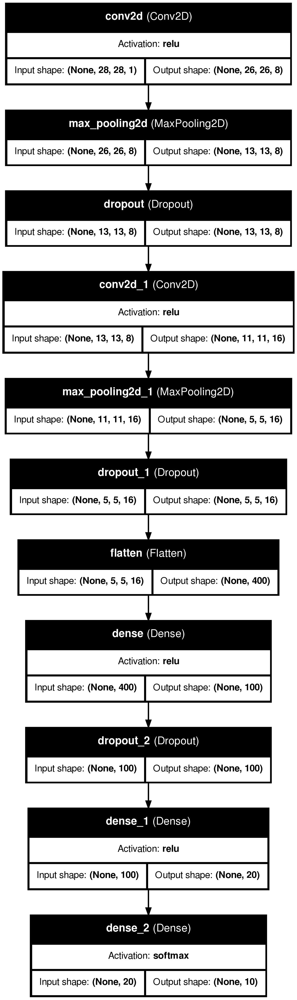

In [55]:
tf.keras.backend.clear_session()

modelCNN = tf.keras.Sequential()
modelCNN.add(tf.keras.layers.InputLayer(input_shape=[28, 28, 1]))

modelCNN.add(tf.keras.layers.Conv2D(8, kernel_size=(3,3),  activation='relu') )
modelCNN.add(tf.keras.layers.MaxPooling2D((2,2)))
modelCNN.add(tf.keras.layers.Dropout(0.3))

modelCNN.add(tf.keras.layers.Conv2D(16, (3,3), activation='relu') )
modelCNN.add(tf.keras.layers.MaxPooling2D((2,2)))
modelCNN.add(tf.keras.layers.Dropout(0.2))

modelCNN.add(tf.keras.layers.Flatten())
modelCNN.add(tf.keras.layers.Dense(100, activation="relu"))
modelCNN.add(tf.keras.layers.Dropout(0.3))
modelCNN.add(tf.keras.layers.Dense(20, activation="relu"))
modelCNN.add(tf.keras.layers.Dense(nclass, activation="softmax"))

t4pPC.centerTitle("Summary of the model")
modelCNN.summary()

t4pPC.centerTitle("Layers")
modelCNN.layers

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(modelCNN, show_shapes=True, show_layer_names=True, show_layer_activations=True)

In [56]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)

modelCNN.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
historyCNN = modelCNN.fit(X_trainR, y_train,
                    epochs = 30,
                    validation_data=(X_validR, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

Epoch 1/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.6105 - loss: 1.0364 - val_accuracy: 0.8194 - val_loss: 0.4872 - learning_rate: 0.1000
Epoch 2/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7903 - loss: 0.5554 - val_accuracy: 0.8226 - val_loss: 0.4496 - learning_rate: 0.1000
Epoch 3/30
1710/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8136 - loss: 0.4945
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8136 - loss: 0.4945 - val_accuracy: 0.8584 - val_loss: 0.3922 - learning_rate: 0.1000
Epoch 4/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8347 - loss: 0.4432 - val_accuracy: 0.8584 - val_loss: 0.3626 - learning_rate: 0.0500
Epoch 5/30
1707/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8414 - loss: 0.4243
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8414 - loss: 0

In [57]:
t4pPC.centerTitle("history.params")
historyCNN.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyCNNDf = pd.DataFrame(historyCNN.history)
display(historyCNNDf)

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.711418,0.768637,0.8194,0.487164,0.100000
1,0.797873,0.537218,0.8226,0.449629,0.100000
2,0.818800,0.487150,0.8584,0.392183,0.100000
3,0.836218,0.438785,0.8584,0.362635,0.050000
4,0.842727,0.422522,0.8580,0.372946,0.050000
5,0.850255,0.401375,0.8806,0.326103,0.025000
6,0.852436,0.396297,0.8818,0.318770,0.025000
7,0.855164,0.387720,0.8814,0.322836,0.012500
8,0.855891,0.386786,0.8816,0.322782,0.012500
9,0.860782,0.378679,0.8812,0.314647,0.006250


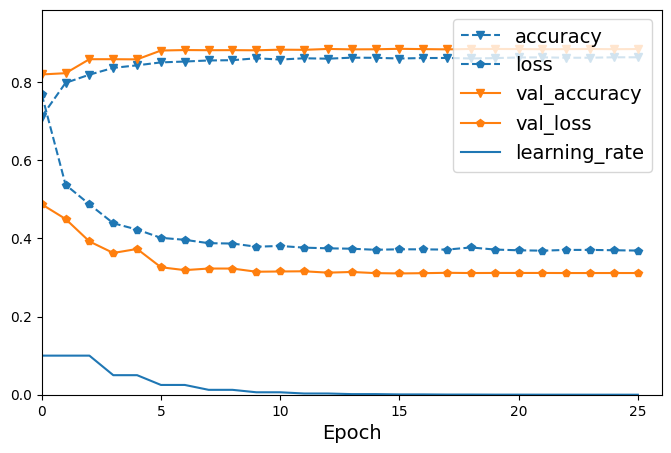

In [58]:
plot_metrics(historyCNNDf)

#### Evaluation of the accuracy

In [59]:
t4pPC.centerTitle("training set")
modelCNN.evaluate(X_trainR, y_train)
t4pPC.centerTitle("validation set")
modelCNN.evaluate(X_validR, y_valid)
t4pPC.centerTitle("test set")
modelCNN.evaluate(X_testR, y_test)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8887 - loss: 0.2955


[0.2995447516441345, 0.888945460319519]

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8842 - loss: 0.3115


[0.3113451302051544, 0.8844000101089478]

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8742 - loss: 0.3408


[0.3354617655277252, 0.8762000203132629]

#### Prediction and comparison with the actual class

In [60]:
y_train_hat = modelCNN.predict(X_trainR)
y_valid_hat = modelCNN.predict(X_validR)
y_test_hat = modelCNN.predict(X_testR)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


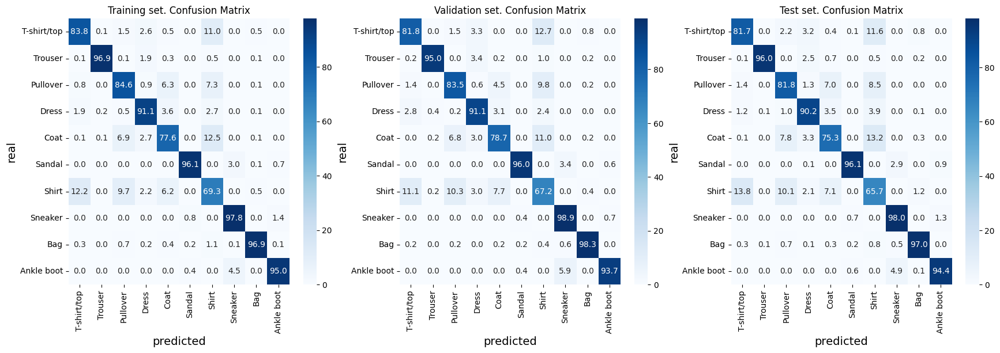

                     Accuracy      MAE         MSE
   Training set.      0.89        0.37        1.54
 Validation set.      0.88        0.38        1.61
       Test set.      0.88        0.41        1.71


In [61]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

### Same as the previous model, but with filtered images

#### Filtering of the images

##### Plot an image sample, before filtering

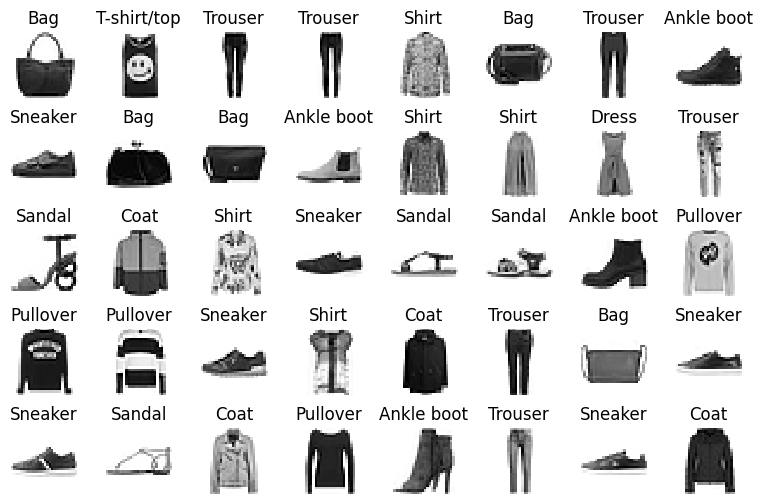

In [62]:
plotFashionToGrid(X_train_full, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)

##### Plot again the same sample, after application of the Sobel filter

(60000, 28, 28)

(60000, 28, 28)

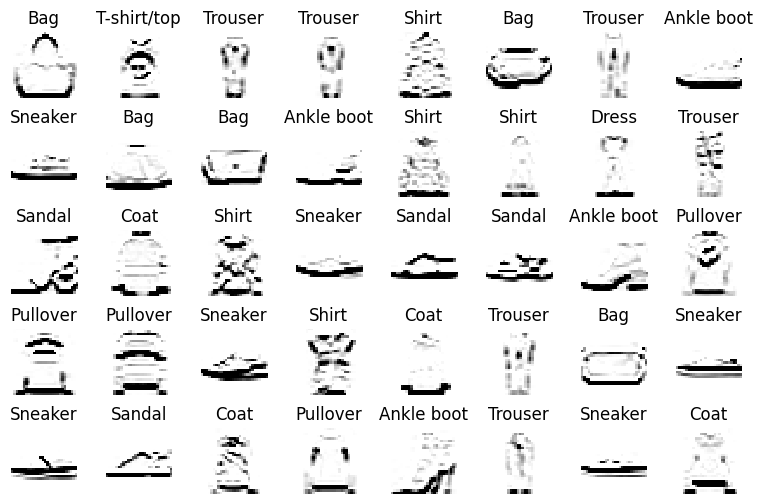

(10000, 28, 28)

(10000, 28, 28)

In [63]:
X_train_fullF=SobelBW(X_train_full)
X_train_full.shape
X_train_fullF.shape
plotFashionToGrid(X_train_fullF, y_train_full, fashion_names, nrows=5, ncols=8, startFrom=100)
X_testF=SobelBW(X_test)
X_test.shape
X_testF.shape

#### Make the training, validation and test sets, and reshape the data to adapt them to `keras.conv2D`

In [64]:
X_trainF, y_train = X_train_fullF[:-5000], y_train_full[:-5000]
X_validF, y_valid = X_train_fullF[-5000:], y_train_full[-5000:]
t4pPC.centerTitle("Training set")
X_trainF.shape
y_train.shape
t4pPC.centerTitle("Validation set")
X_validF.shape
y_valid.shape
t4pPC.centerTitle("Test set")
X_testF.shape
y_test.shape

(55000, 28, 28)

(55000,)

(5000, 28, 28)

(5000,)

(10000, 28, 28)

(10000,)

In [65]:
X_trainFR = reshapeForConv2D(X_trainF)
X_testFR = reshapeForConv2D(X_testF)
X_validFR = reshapeForConv2D(X_validF)

Shape before = (55000, 28, 28)
 Shape after = (55000, 28, 28, 1)
Shape before = (10000, 28, 28)
 Shape after = (10000, 28, 28, 1)
Shape before = (5000, 28, 28)
 Shape after = (5000, 28, 28, 1)


#### Definition of the model

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 26, 26, 8)      │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 13, 13, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 13, 13, 8)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 11, 11, 16)     │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 5, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 5, 5, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 400)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │        40,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 20)             │         2,020 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           210 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 43,578 (170.23 KB)

 Trainable params: 43,578 (170.23 KB)

 Non-trainable params: 0 (0.00 B)

[<Conv2D name=conv2d, built=True>,
 <MaxPooling2D name=max_pooling2d, built=True>,
 <Dropout name=dropout, built=True>,
 <Conv2D name=conv2d_1, built=True>,
 <MaxPooling2D name=max_pooling2d_1, built=True>,
 <Dropout name=dropout_1, built=True>,
 <Flatten name=flatten, built=True>,
 <Dense name=dense, built=True>,
 <Dropout name=dropout_2, built=True>,
 <Dense name=dense_1, built=True>,
 <Dense name=dense_2, built=True>]

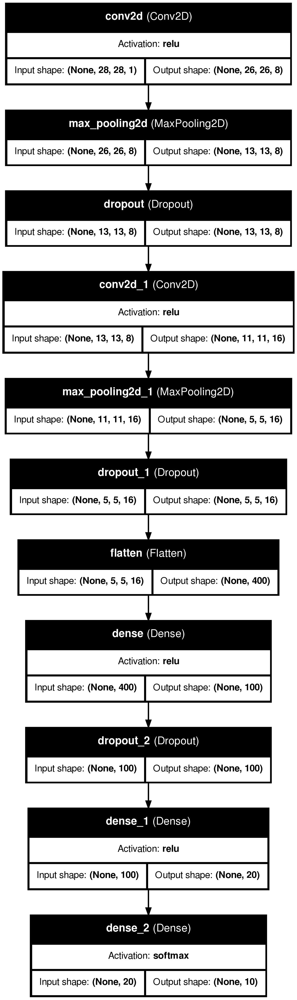

In [66]:
from tensorflow.keras.models import clone_model
modelCNNF = clone_model(modelCNN)

t4pPC.centerTitle("Summary of the model")
modelCNNF.summary()

t4pPC.centerTitle("Layers")
modelCNNF.layers

t4pPC.centerTitle("Plot model")
from tensorflow.keras.utils import plot_model
plot_model(modelCNNF, show_shapes=True, show_layer_names=True, show_layer_activations=True)

#### Training of the CNN model

In [67]:
from tensorflow.keras.optimizers import SGD
optimizer = SGD(learning_rate=0.1)

modelCNNF.compile(loss="sparse_categorical_crossentropy",
              optimizer=optimizer,
              metrics=["accuracy"])

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
rlr = ReduceLROnPlateau(monitor='val_loss',factor=0.5,patience=2,min_lr=1.e-6,verbose=1,min_delta=0.2)

vID.chrono_start()
historyCNNF = modelCNNF.fit(X_trainFR, y_train,
                    epochs = 30,
                    validation_data=(X_validFR, y_valid),
                    verbose = 1,
                    callbacks=[es,rlr],
                   )
vID.chrono_show()

Epoch 1/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.6558 - loss: 0.9483 - val_accuracy: 0.8230 - val_loss: 0.4742 - learning_rate: 0.1000
Epoch 2/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.7964 - loss: 0.5574 - val_accuracy: 0.8446 - val_loss: 0.4125 - learning_rate: 0.1000
Epoch 3/30
1705/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8149 - loss: 0.5047
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.05000000074505806.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8150 - loss: 0.5046 - val_accuracy: 0.8496 - val_loss: 0.4085 - learning_rate: 0.1000
Epoch 4/30
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8336 - loss: 0.4460 - val_accuracy: 0.8708 - val_loss: 0.3483 - learning_rate: 0.0500
Epoch 5/30
1715/1719 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8433 - loss: 0.4228
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.02500000037252903.
1719/1719 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8433 - loss: 0

{'verbose': 1, 'epochs': 30, 'steps': 1719}

,accuracy,loss,val_accuracy,val_loss,learning_rate
0,0.735291,0.730298,0.8230,0.474196,0.100000
1,0.802145,0.539965,0.8446,0.412480,0.100000
2,0.820473,0.490972,0.8496,0.408537,0.100000
3,0.836309,0.440117,0.8708,0.348266,0.050000
4,0.842345,0.426072,0.8714,0.348358,0.050000
5,0.849418,0.409600,0.8770,0.336476,0.025000
6,0.849818,0.401192,0.8756,0.330102,0.025000
7,0.852364,0.392979,0.8762,0.321547,0.012500
8,0.855545,0.386407,0.8804,0.317436,0.012500
9,0.856945,0.380694,0.8834,0.317985,0.006250


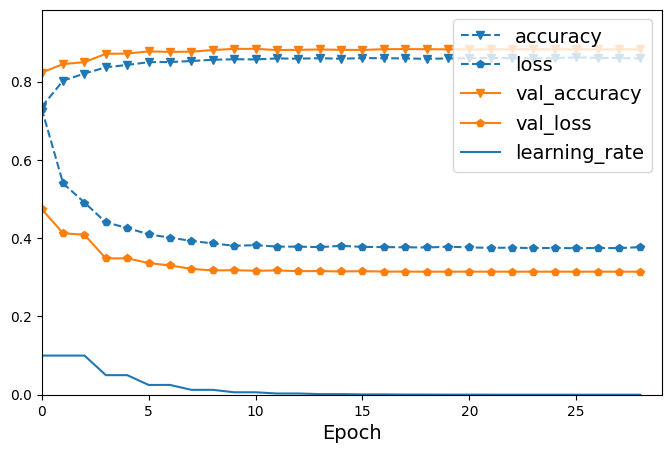

In [74]:
t4pPC.centerTitle("history.params")
historyCNNF.params
t4pPC.centerTitle("history.history")
import pandas as pd
historyCNNFDf = pd.DataFrame(historyCNNF.history)
display(historyCNNFDf)

plot_metrics(historyCNNFDf)

#### Evaluation of the accuracy

In [76]:
t4pPC.centerTitle("training set")
modelCNNF.evaluate(X_trainFR, y_train)
t4pPC.centerTitle("validation set")
modelCNNF.evaluate(X_validFR, y_valid)
t4pPC.centerTitle("test set")
modelCNNF.evaluate(X_testFR, y_test)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.8931 - loss: 0.2911


[0.29576119780540466, 0.8910181522369385]

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8827 - loss: 0.3143


[0.31425902247428894, 0.8820000290870667]

313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8764 - loss: 0.3392


[0.34027865529060364, 0.8730999827384949]

#### Prediction and comparison with the actual class

In [77]:
y_train_hat = modelCNNF.predict(X_trainFR)
y_valid_hat = modelCNNF.predict(X_validFR)
y_test_hat = modelCNNF.predict(X_testFR)

1719/1719 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


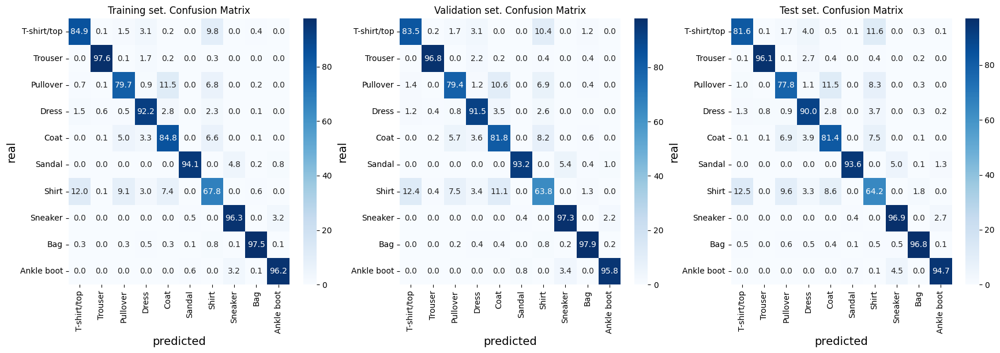

                     Accuracy      MAE         MSE
   Training set.      0.89        0.35        1.46
 Validation set.      0.88        0.38        1.55
       Test set.      0.87        0.41        1.69


In [78]:
plotConfusionMatrix(y_train, y_train_hat, y_valid, y_valid_hat, y_test, y_test_hat, fashion_names)

## Appendix: additional functions

### Salt and pepper

(1014, 1600)

Image = 1014 pixels x 1600 pixels = 1622400 pixels
Number of random black/white pixels = 16224
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


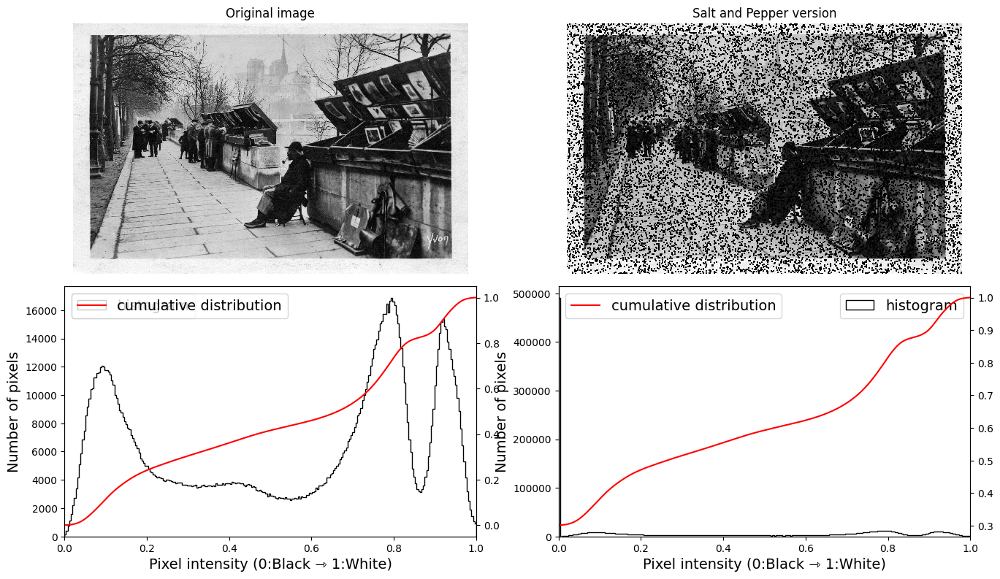

In [72]:
def add_SaltPepperNoise(img, ratio=10, CornSize = 3, SaltAndPepper="SaltAndPepper",show=True): 
    import random
    import matplotlib.pyplot as plt
    import numpy as np
    # Getting the dimensions of the image 
    row , col = img.shape 
    imgNew = img.copy()

    npix = row*col
    print(f"Image = {row} pixels x {col} pixels = {npix} pixels")
    number_of_pixels = npix*ratio//100 
    print(f"Number of random black/white pixels = {number_of_pixels}")
    shift = CornSize//2
    if SaltAndPepper == 'SaltAndPepper' or SaltAndPepper == 'Salt':
        # Randomly pick some pixels in the image for coloring them white
        for i in range(number_of_pixels): 
            yrow=random.randint(0, row - 1) 
            xcol=random.randint(0, col - 1)
            for y in range(yrow-shift,yrow+shift):
                for x in range(xcol-shift,xcol+shift):
                    yR = max(min(y,0),min(y,row-1))
                    xR = max(min(x,0),min(x,col-1))
                    imgNew[yR][xR] = 1.
    if SaltAndPepper == 'SaltAndPepper' or SaltAndPepper == 'Pepper':
        # Randomly pick some pixels in the image for coloring them black 
        for i in range(number_of_pixels): 
            yrow=random.randint(0, row - 1) 
            xcol=random.randint(0, col - 1) 
            for y in range(yrow-shift,yrow+shift):
                for x in range(xcol-shift,xcol+shift):
                    yR = max(min(y,0),min(y,row-1))
                    xR = max(min(x,0),min(x,col-1))
                    imgNew[yR][xR] = 0.
    if show:
        plotimgs_SideBySide([img,imgNew], imgW=8, titles=["Original image", "Salt and Pepper version"], histogram=True)
    return imgNew

from matplotlib import pyplot as plt
from skimage.color import rgb2gray
img = plt.imread('./ML-Figures/bouquinistes/bouquinistes.jpg')
img = rgb2gray(img)
img.shape
imgPepper = add_SaltPepperNoise(img, 1, 7, SaltAndPepper="Pepper")
plt.imsave('./ML-Figures/bouquinistes/bouquinistesPepper.jpg', imgPepper, cmap="gray")

### Sobel filter

<div class="intro">
    
The Sobel operator, sometimes called the Sobel–Feldman operator or Sobel filter, is used in image processing and computer vision, particularly within edge detection algorithms where it creates an image emphasising edges
</div>

[[-1 -2 -1]
 [ 0  0  0]
 [ 1  2  1]]
W: 1600 pixels x H: 1014 pixels = 1622400 pixels


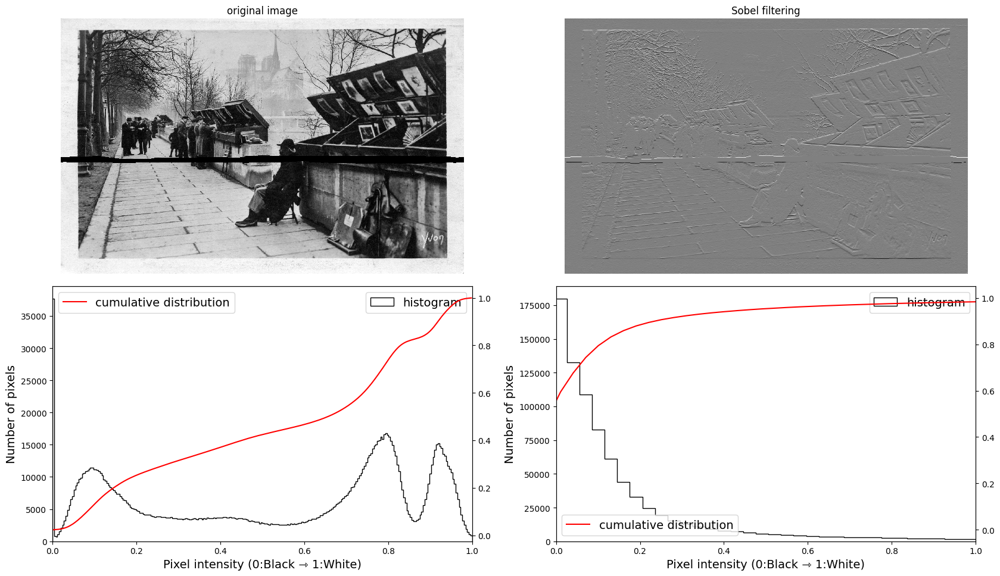

W: 1600 pixels x H: 1014 pixels = 1622400 pixels


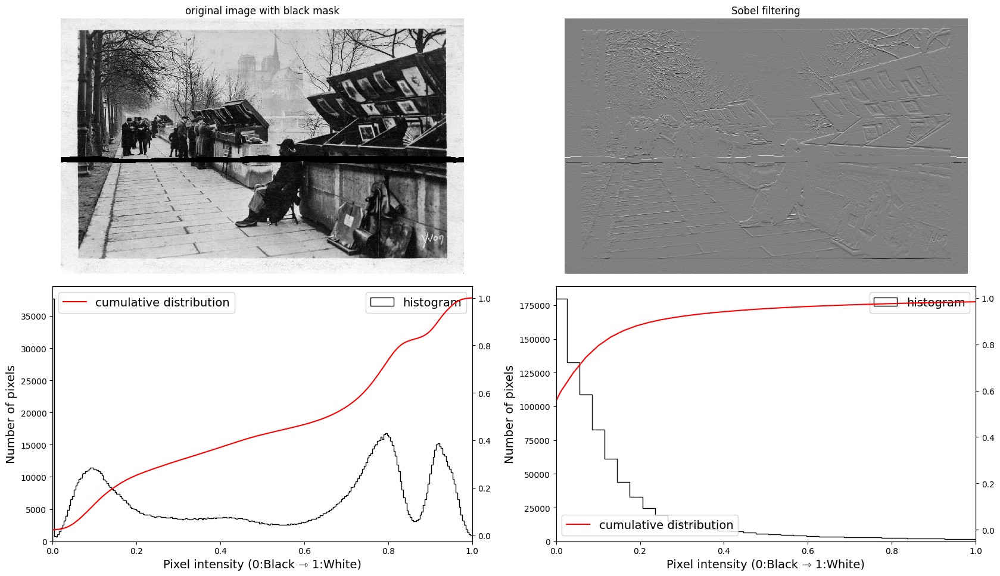

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage.color import rgb2gray
    
Sobel = np.array([-1, -2, -1,0,0,0,1,2,1])
Sobel=Sobel.reshape(3,3)
print(Sobel)

imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesTorned.jpg')
# imgT = plt.imread('./ML-Figures/bouquinistes/bouquinistesPepper.jpg')
imgTGray = rgb2gray(imgT)
contourT = convolve(imgTGray,Sobel,mode='reflect')
plotimgs_SideBySide([imgTGray, contourT],imgW=10,titles=["original image","Sobel filtering"])

imgTWM =  plt.imread('./ML-Figures/bouquinistes/bouquinistesTornedWithMask.jpg')
# imgTWM =  plt.imread('./ML-Figures/bouquinistes/bouquinistesPepper.jpg')
imgTWMGray = rgb2gray(imgTWM)
contourTWM = convolve(imgTWMGray,Sobel,mode='reflect')
plotimgs_SideBySide([imgTWMGray, contourTWM],imgW=10,titles=["original image with black mask","Sobel filtering"])


# Useful links

[Convolution article on Wikipedia](https://en.wikipedia.org/wiki/Convolution)

[Hands-on machine learning with scikit-learn, keras and tensorflow (3rd edition, **2022**), Aurélien Géron, O'Reilly editions](https://github.com/ageron/handson-ml3)

Some images were generated with [DALL·E](https://openai.com/dall-e-2)